<a href="https://colab.research.google.com/github/hamletbatista/sej/blob/master/An_Introduction_to_Natural_Language_Processing_with_Python_for_SEOs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#An Introduction to Natural Language Processing with Python for SEOs

We are going to learn practical NLP while building a simple knowledge graph from scratch. 

We are going to extract useful facts automatically from SEJ XML sitemaps.

In order to do this and keep things simple and fast, we will pull article headlines from the URLs in the XML sitemaps.

We will extract entities of interest and their relationships from the headlines.

Finally, we will build a powerful knowledge graph and visualize the most popular relationships.

Here is the technical plan:

1. We will fetch all SEJ XML sitemaps
2. We will parse the URLs to extract the headlines in their slugs 
3. We will extract entity pairs from the headlines 
4. We will extract corresponding relationships
5. We will build a knowledge graph and a simple form to visualize specific relationships

Resources to learn more



##Fetching all SEJ XML sitemaps

We recently did a webinar with Elias from The Money Supermarket and learned about his wonderful Python library for marketers: advertools.

Some of my old articles are not working with the newer library versions. He gave me a good idea to print the library versions so it is easy to get the code to work.

In [ ]:
%%capture
!pip install advertools

In [ ]:
import advertools as adv
print(adv.__version__)

0.10.6


In [ ]:
sitemap_url = "https://www.searchenginejournal.com/sitemap_index.xml" #@param {type:"string"}


Let's download the sitemap index

In [ ]:
df = adv.sitemap_to_df(sitemap_url)

INFO:root:Getting https://www.searchenginejournal.com/post-sitemap1.xml
INFO:root:Getting https://www.searchenginejournal.com/post-sitemap2.xml
INFO:root:Getting https://www.searchenginejournal.com/post-sitemap3.xml
INFO:root:Getting https://www.searchenginejournal.com/post-sitemap4.xml
INFO:root:Getting https://www.searchenginejournal.com/post-sitemap5.xml
INFO:root:Getting https://www.searchenginejournal.com/post-sitemap6.xml
INFO:root:Getting https://www.searchenginejournal.com/post-sitemap7.xml
INFO:root:Getting https://www.searchenginejournal.com/post-sitemap8.xml
INFO:root:Getting https://www.searchenginejournal.com/post-sitemap9.xml
INFO:root:Getting https://www.searchenginejournal.com/post-sitemap10.xml
INFO:root:Getting https://www.searchenginejournal.com/post-sitemap11.xml
INFO:root:Getting https://www.searchenginejournal.com/post-sitemap12.xml
INFO:root:Getting https://www.searchenginejournal.com/post-sitemap13.xml
INFO:root:Getting https://www.searchenginejournal.com/post-s

One cool feature in the package is that it downloaded all the linked sitemaps in the index and we get a nice dataframe

---



In [ ]:
%load_ext google.colab.data_table

In [ ]:
df

,loc,lastmod,sitemap,download_date,image_loc,image_caption,image_title,publication_name,publication_language,news_genres,news_publication_date,news_title
0,https://www.searchenginejournal.com/,2020-08-11 19:57:10+00:00,https://www.searchenginejournal.com/post-sitem...,2020-08-12 00:00:04.051289+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,https://www.searchenginejournal.com/microsoft-...,NaT,https://www.searchenginejournal.com/post-sitem...,2020-08-12 00:00:04.051289+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,https://www.searchenginejournal.com/website-us...,NaT,https://www.searchenginejournal.com/post-sitem...,2020-08-12 00:00:04.051289+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,https://www.searchenginejournal.com/the-5-step...,NaT,https://www.searchenginejournal.com/post-sitem...,2020-08-12 00:00:04.051289+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,https://www.searchenginejournal.com/online-adv...,NaT,https://www.searchenginejournal.com/post-sitem...,2020-08-12 00:00:04.051289+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
19662,https://www.searchenginejournal.com/google-hol...,NaT,https://www.searchenginejournal.com/news-sitem...,2020-08-12 00:00:04.051289+00:00,https://cdn.searchenginejournal.com/wp-content...,NaN,0B111628-2E0F-4839-9A07-20F66255375F,Search Engine Journal,en,usergenerated,2020-08-10T16:23:16+00:00,Google Holding First-Ever Virtual Conference o...
19663,https://www.searchenginejournal.com/how-to-get...,NaT,https://www.searchenginejournal.com/news-sitem...,2020-08-12 00:00:04.051289+00:00,https://cdn.searchenginejournal.com/wp-content...,register,Featured Image - Directive Consultinig,Search Engine Journal,en,usergenerated,2020-08-10T16:00:27+00:00,How to Get More Quality Leads for Your SaaS Br...
19664,https://www.searchenginejournal.com/google-ads...,NaT,https://www.searchenginejournal.com/news-sitem...,2020-08-12 00:00:04.051289+00:00,https://cdn.searchenginejournal.com/wp-content...,Google Ads tools,Google Ads tools,Search Engine Journal,en,usergenerated,2020-08-10T13:45:48+00:00,5 Amazing Google Ads Tools You Need to Use
19665,https://www.searchenginejournal.com/hard-soft-...,NaT,https://www.searchenginejournal.com/news-sitem...,2020-08-12 00:00:04.051289+00:00,https://cdn.searchenginejournal.com/wp-content...,Hard and Soft Skills,NaN,Search Engine Journal,en,usergenerated,2020-08-10T12:45:34+00:00,The 11 Most Important Hard & Soft Skills Marke...


Look how simple it is to filter articles/pages from this year. We have 1550 articles

In [ ]:
df[df["lastmod"] > '2020-01-01']

,loc,lastmod,sitemap,download_date,image_loc,image_caption,image_title,publication_name,publication_language,news_genres,news_publication_date,news_title
0,https://www.searchenginejournal.com/,2020-08-11 19:57:10+00:00,https://www.searchenginejournal.com/post-sitem...,2020-08-12 00:00:04.051289+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17114,https://www.searchenginejournal.com/heading-ta...,2020-01-03 00:05:53+00:00,https://www.searchenginejournal.com/post-sitem...,2020-08-12 00:00:04.051289+00:00,https://cdn.searchenginejournal.com/wp-content...,heading elements and google seo,google headings seo,NaN,NaN,NaN,NaN,NaN
17115,https://www.searchenginejournal.com/elegant-th...,2020-01-04 06:12:18+00:00,https://www.searchenginejournal.com/post-sitem...,2020-08-12 00:00:04.051289+00:00,https://cdn.searchenginejournal.com/wp-content...,divi theme vulnerability,divi theme vulnerability,NaN,NaN,NaN,NaN,NaN
17116,https://www.searchenginejournal.com/google-how...,2020-01-06 11:23:40+00:00,https://www.searchenginejournal.com/post-sitem...,2020-08-12 00:00:04.051289+00:00,https://cdn.searchenginejournal.com/wp-content...,How to SEO a Podcast Site,seo for podcasts,NaN,NaN,NaN,NaN,NaN
17117,https://www.searchenginejournal.com/track-offl...,2020-01-07 12:45:50+00:00,https://www.searchenginejournal.com/post-sitem...,2020-08-12 00:00:04.051289+00:00,https://cdn.searchenginejournal.com/wp-content...,Call Forwarding Detail,tracking-offline-conversions,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
18799,https://www.searchenginejournal.com/author/ste...,2020-01-15 14:46:02+00:00,https://www.searchenginejournal.com/author-sit...,2020-08-12 00:00:04.051289+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18800,https://www.searchenginejournal.com/author/ari...,2020-01-14 02:32:11+00:00,https://www.searchenginejournal.com/author-sit...,2020-08-12 00:00:04.051289+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18801,https://www.searchenginejournal.com/author/jon...,2020-01-13 04:03:28+00:00,https://www.searchenginejournal.com/author-sit...,2020-08-12 00:00:04.051289+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18802,https://www.searchenginejournal.com/author/chr...,2020-01-06 14:51:35+00:00,https://www.searchenginejournal.com/author-sit...,2020-08-12 00:00:04.051289+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df[df["lastmod"] > '2020-01-01'][["loc", "lastmod"]].to_csv("latest_articles.csv", index=False)

We can export this list to a csv. I will include only the URL and last modification time stamp.

If you click on the file folder to the left, you will see the file and you can right click to download it.

##Extract headlines from the URLs

The advertools library has a function to break URLs, but let's do it manually to get familiar with the process.

In [ ]:
example_url="https://www.searchenginejournal.com/google-be-careful-relying-on-3rd-parties-to-render-website-content/376547/" #@param {type:"string"} 


In [ ]:
from urllib.parse import urlparse
import re

In [ ]:
u = urlparse(example_url)

In [ ]:
u

ParseResult(scheme='https', netloc='www.searchenginejournal.com', path='/google-be-careful-relying-on-3rd-parties-to-render-website-content/376547/', params='', query='', fragment='')

Here we get a named tuple, ```ParseResult```, with a breakdown of the URL components.

We are interested in the ```path```.

We are going to use a simple regex to split it by / and - characters

In [ ]:
slug = re.split("[/-]", u.path)

slug

['',
 'google',
 'be',
 'careful',
 'relying',
 'on',
 '3rd',
 'parties',
 'to',
 'render',
 'website',
 'content',
 '376547',
 '']

Next, we can convert it back to a string

In [ ]:
headline = " ".join(slug)
headline

' google be careful relying on 3rd parties to render website content 376547 '

The slugs contain a page identifier that is useless for us. We will remove with a regex

In [ ]:
headline = re.sub("\d{6}", "",headline)
headline


' google be careful relying on 3rd parties to render website content  '

Strip whitespace at the borders

In [ ]:
headline = headline.strip()
headline

'google be careful relying on 3rd parties to render website content'

In [ ]:
if re.match("author|category", "autho stephen kenwright"):
  print("Ok")

We can convert this code to a function and create a new column in our dataframe

In [ ]:
def get_headline(url):

  u = urlparse(url)

  if len(u.path) > 1:

    slug = re.split("[/-]", u.path)

    new_headline = re.sub("\d{6}", ""," ".join(slug)).strip()

    #skip author and category pages
    if not re.match("author|category", new_headline):
      return new_headline

  return ""




In [ ]:
#let's test it
get_headline(example_url)

'google be careful relying on 3rd parties to render website content'

In [ ]:
import pandas as pd

#skip the home page and headers
new_df = pd.read_csv("latest_articles.csv", names=["url", "lastmod"], skiprows=2)

In [ ]:
new_df

,url,lastmod
0,https://www.searchenginejournal.com/heading-ta...,2020-01-03 00:05:53+00:00
1,https://www.searchenginejournal.com/elegant-th...,2020-01-04 06:12:18+00:00
2,https://www.searchenginejournal.com/google-how...,2020-01-06 11:23:40+00:00
3,https://www.searchenginejournal.com/track-offl...,2020-01-07 12:45:50+00:00
4,https://www.searchenginejournal.com/do-ugly-si...,2020-01-06 21:55:09+00:00
...,...,...
1544,https://www.searchenginejournal.com/author/ste...,2020-01-15 14:46:02+00:00
1545,https://www.searchenginejournal.com/author/ari...,2020-01-14 02:32:11+00:00
1546,https://www.searchenginejournal.com/author/jon...,2020-01-13 04:03:28+00:00
1547,https://www.searchenginejournal.com/author/chr...,2020-01-06 14:51:35+00:00


Let's create a new column named headline

In [ ]:
new_df["url"]

0       https://www.searchenginejournal.com/heading-ta...
1       https://www.searchenginejournal.com/elegant-th...
2       https://www.searchenginejournal.com/google-how...
3       https://www.searchenginejournal.com/track-offl...
4       https://www.searchenginejournal.com/do-ugly-si...
                              ...                        
1544    https://www.searchenginejournal.com/author/ste...
1545    https://www.searchenginejournal.com/author/ari...
1546    https://www.searchenginejournal.com/author/jon...
1547    https://www.searchenginejournal.com/author/chr...
1548    https://www.searchenginejournal.com/author/ton...
Name: url, Length: 1549, dtype: object

this will run the function on each URL

In [ ]:
new_df["url"].apply(lambda x: get_headline(x))

0                                  heading tags for seo
1                          elegant themes vulnerability
2                        google how to seo podcast site
3       track offline conversions microsoft advertising
4                                    do ugly sites sell
                             ...                       
1544                                                   
1545                                                   
1546                                                   
1547                                                   
1548                                                   
Name: url, Length: 1549, dtype: object

In [ ]:
new_df["headline"] = new_df["url"].apply(lambda x: get_headline(x))

In [ ]:
new_df

,url,lastmod,headline
0,https://www.searchenginejournal.com/heading-ta...,2020-01-03 00:05:53+00:00,heading tags for seo
1,https://www.searchenginejournal.com/elegant-th...,2020-01-04 06:12:18+00:00,elegant themes vulnerability
2,https://www.searchenginejournal.com/google-how...,2020-01-06 11:23:40+00:00,google how to seo podcast site
3,https://www.searchenginejournal.com/track-offl...,2020-01-07 12:45:50+00:00,track offline conversions microsoft advertising
4,https://www.searchenginejournal.com/do-ugly-si...,2020-01-06 21:55:09+00:00,do ugly sites sell
...,...,...,...
1544,https://www.searchenginejournal.com/author/ste...,2020-01-15 14:46:02+00:00,
1545,https://www.searchenginejournal.com/author/ari...,2020-01-14 02:32:11+00:00,
1546,https://www.searchenginejournal.com/author/jon...,2020-01-13 04:03:28+00:00,
1547,https://www.searchenginejournal.com/author/chr...,2020-01-06 14:51:35+00:00,


In [ ]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1549 entries, 0 to 1548
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   url       1549 non-null   object
 1   lastmod   1549 non-null   object
 2   headline  1549 non-null   object
dtypes: object(3)
memory usage: 36.4+ KB


## Extracting named entities



Let's get our list of headlines and convert to a single text document

In [ ]:
new_df["headline"].tolist()[:10]

['heading tags for seo',
 'elegant themes vulnerability',
 'google how to seo podcast site',
 'track offline conversions microsoft advertising',
 'do ugly sites sell',
 'youtubes coppa changes begin today possibly affecting creator revenue',
 'googles john mueller our seos have it harder than others',
 'seo struggles',
 'challenge google ads trademark disputes',
 'best amp wordpress plugins']

In [ ]:
text = "\n".join([x for x in new_df["headline"].tolist() if len(x) > 0])

In [ ]:
with open("text.txt", "w") as f:
  f.write(text)

In [ ]:
print(text)

## Introducing Spacy

https://spacy.io/usage/spacy-101

https://spacy.io/usage/examples

https://spacy.io/api/annotation

In [ ]:
import spacy
from spacy import displacy

In [ ]:
nlp = spacy.load("en_core_web_sm")


In [ ]:
doc = nlp(text)


In [ ]:
displacy.render(doc, style="ent", jupyter=True)

## Building a Knowledge Graph

1. https://www.analyticsvidhya.com/blog/2019/10/how-to-build-knowledge-graph-text-using-spacy/

2. https://www.analyticsvidhya.com/blog/2019/09/introduction-information-extraction-python-spacy/?utm_source=blog&utm_medium=how-to-build-knowledge-graph-text-using-spacy
3. https://www.kaggle.com/shivamb/spacy-text-meta-features-knowledge-graphs



Let’s get the dependency tags 

In [ ]:
for tok in doc[:100]:
  print(tok.text, "...", tok.dep_)

heading ... ROOT
tags ... dobj
for ... prep
seo ... nmod

 ... 
elegant ... amod
themes ... compound
vulnerability ... pobj

 ... 
google ... ROOT
how ... advmod
to ... aux
seo ... xcomp
podcast ... compound
site ... dobj

 ... 
track ... compound
offline ... compound
conversions ... appos
microsoft ... compound
advertising ... ROOT

 ... 
do ... aux
ugly ... amod
sites ... nsubj
sell ... ROOT

 ... 
youtubes ... compound
coppa ... compound
changes ... nsubj
begin ... ROOT
today ... npadvmod
possibly ... advmod
affecting ... xcomp
creator ... compound
revenue ... dobj

 ... 
googles ... compound
john ... compound
mueller ... ROOT
our ... poss
seos ... nsubj
have ... ROOT
it ... dobj
harder ... advmod
than ... prep
others ... pobj

 ... 
seo ... compound
struggles ... ROOT

 ... 
challenge ... compound
google ... compound
ads ... compound
trademark ... compound
disputes ... ROOT

 ... 
best ... advmod
amp ... compound
wordpress ... nsubj
plugins ... ROOT

 ... 
chrome ... nsubj
push ...

The rule can be something like this — extract the subject/object along with its modifiers, compound words and also extract the punctuation marks between them.

In [ ]:
from spacy.matcher import Matcher 
from spacy.tokens import Span 
import networkx as nx

import matplotlib.pyplot as plt
from tqdm import tqdm

To build a knowledge graph, the most important things are the nodes and the edges between them.

The main idea is to go through a sentence and extract the subject and the object as and when they are encountered

In [ ]:
def get_entities(sent):
  ## chunk 1
  ent1 = ""
  ent2 = ""

  prv_tok_dep = ""    # dependency tag of previous token in the sentence
  prv_tok_text = ""   # previous token in the sentence

  prefix = ""
  modifier = ""

  #############################################################
  
  for tok in nlp(sent):
    ## chunk 2
    # if token is a punctuation mark then move on to the next token
    if tok.dep_ != "punct":
      # check: token is a compound word or not
      if tok.dep_ == "compound":
        prefix = tok.text
        # if the previous word was also a 'compound' then add the current word to it
        if prv_tok_dep == "compound":
          prefix = prv_tok_text + " "+ tok.text
      
      # check: token is a modifier or not
      if tok.dep_.endswith("mod") == True:
        modifier = tok.text
        # if the previous word was also a 'compound' then add the current word to it
        if prv_tok_dep == "compound":
          modifier = prv_tok_text + " "+ tok.text
      
      ## chunk 3
      if tok.dep_.find("subj") == True:
        ent1 = modifier +" "+ prefix + " "+ tok.text
        prefix = ""
        modifier = ""
        prv_tok_dep = ""
        prv_tok_text = ""      

      ## chunk 4
      if tok.dep_.find("obj") == True:
        ent2 = modifier +" "+ prefix +" "+ tok.text
        
      ## chunk 5  
      # update variables
      prv_tok_dep = tok.dep_
      prv_tok_text = tok.text
  #############################################################

  return [ent1.strip(), ent2.strip()]

In [ ]:
get_entities("the film had 200 patents")


['film', '200  patents']

In [ ]:
for t in [x for x in new_df["headline"].tolist() if len(x) > 0][:100]:
  print(get_entities(t))

['', 'seo']
['', '']
['', 'how podcast site']
['track offline conversions', '']
['ugly  sites', '']
['youtubes coppa youtubes changes', 'possibly creator revenue']
['googles john seos', 'harder  others']
['', '']
['', '']
['best  amp', '']
['chrome', '']
['google assistant', '500 million 500 users']
['', '']
['seo metrics', 'how  them']
['google optimization', '']
['twitter', 'new explore tab']
['b2b', 'greg finn podcast']
['instagram user growth', 'lower  levels']
['', '']
['', 'advertiser']
['', '']
['quality raters', 'ranking  signals']
['', '']
['', '']
['', 'unknown']
['', '']
['facebook', 'desktop users']
['', 'now search engine eu']
['actionable tasking seo', 'important  questions']
['', '']
['googles', 'how  it']
['', '']
['', 'paid  marketing']
['google ads', 'smart simulator bidding']
['modal popups', '']
['', 'python seo spreadsheets']
['', '']
['user behavior', 'tools']
['2020 core update', '']
['', 'social media 2019']
['google ads', 'mandatory video campaigns']
['', '']
[

In [ ]:
entity_pairs = []

for i in tqdm([x for x in new_df["headline"].tolist() if len(x) > 0]):
  entity_pairs.append(get_entities(i))

100%|██████████| 1433/1433 [00:14<00:00, 100.78it/s]


In [ ]:
entity_pairs[10:20]

[['chrome', ''],
 ['google assistant', '500 million 500 users'],
 ['', ''],
 ['seo metrics', 'how  them'],
 ['google optimization', ''],
 ['twitter', 'new explore tab'],
 ['b2b', 'greg finn podcast'],
 ['instagram user growth', 'lower  levels'],
 ['', ''],
 ['', 'advertiser']]

Our hypothesis is that the predicate is actually the main verb in a sentence.

In [ ]:
def get_relation(sent):

  doc = nlp(sent)

  # Matcher class object 
  matcher = Matcher(nlp.vocab)

  #define the pattern 
  pattern = [{'DEP':'ROOT'}, 
            {'DEP':'prep','OP':"?"},
            {'DEP':'agent','OP':"?"},  
            {'POS':'ADJ','OP':"?"}] 

  matcher.add("matching_1", None, pattern) 

  matches = matcher(doc)
  k = len(matches) - 1

  span = doc[matches[k][1]:matches[k][2]] 

  return(span.text)

In [ ]:
get_relation("John completed the task")


'completed'

In [ ]:
relations = [get_relation(i) for i in tqdm([x for x in new_df["headline"].tolist() if len(x) > 0])]


100%|██████████| 1433/1433 [00:14<00:00, 97.45it/s]


In [ ]:
entity_pairs[10:20]

[['chrome', ''],
 ['google assistant', '500 million 500 users'],
 ['', ''],
 ['seo metrics', 'how  them'],
 ['google optimization', ''],
 ['twitter', 'new explore tab'],
 ['b2b', 'greg finn podcast'],
 ['instagram user growth', 'lower  levels'],
 ['', ''],
 ['', 'advertiser']]

In [ ]:
relations[10:20]

['blocker',
 'has',
 'conversions',
 'reports',
 'ppc',
 'rolls',
 'paid',
 'drops to lower',
 'marketers',
 'facebook']

In [ ]:
pd.Series(relations).value_counts()[4:50]

launches          12
facebook          11
is                11
strategy          10
trends            10
google             9
on                 9
makes              9
search             9
adds               9
improve            8
explains           8
examples           8
optimize           8
content            8
link               8
lets               7
covid              7
get                7
google on          7
use                7
ways               7
links              7
update             7
introduces         7
tools              7
podcast            7
ads                6
plugins            6
vulnerability      6
paid               6
instagram          5
expands            5
says               5
find               5
are                5
reveals            5
introduces new     5
ppc                5
building for       5
make               5
engines            5
factors            4
know               4
facts              4
building           4
dtype: int64

Let's build the knowledge graph

In [ ]:
# extract subject
source = [i[0] for i in entity_pairs]

# extract object
target = [i[1] for i in entity_pairs]

kg_df = pd.DataFrame({'source':source, 'target':target, 'edge':relations})

In [ ]:
# create a directed-graph from a dataframe
G=nx.from_pandas_edgelist(kg_df, "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

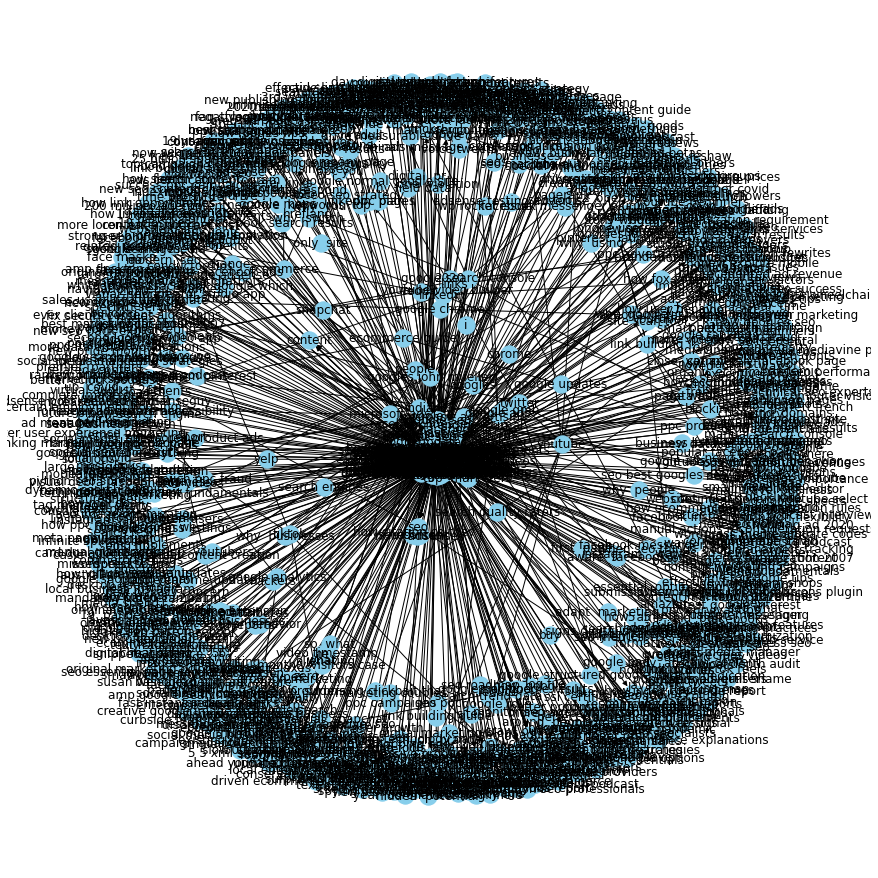

In [ ]:
plt.figure(figsize=(12,12))

pos = nx.spring_layout(G)
nx.draw(G, with_labels=True, node_color='skyblue', edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

use only a few important relations to visualize a graph. I will take one relation at a time.

In [ ]:
def display_graph(relation):

  G=nx.from_pandas_edgelist(kg_df[kg_df['edge']==relation], "source", "target", 
                            edge_attr=True, create_using=nx.MultiDiGraph())

  plt.figure(figsize=(12,12))
  pos = nx.spring_layout(G, k = 0.5) # k regulates the distance between nodes
  nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos = pos)
  plt.show()

Now, when I run ```display_graph("launches")```, I get the graph at the begining of the article.

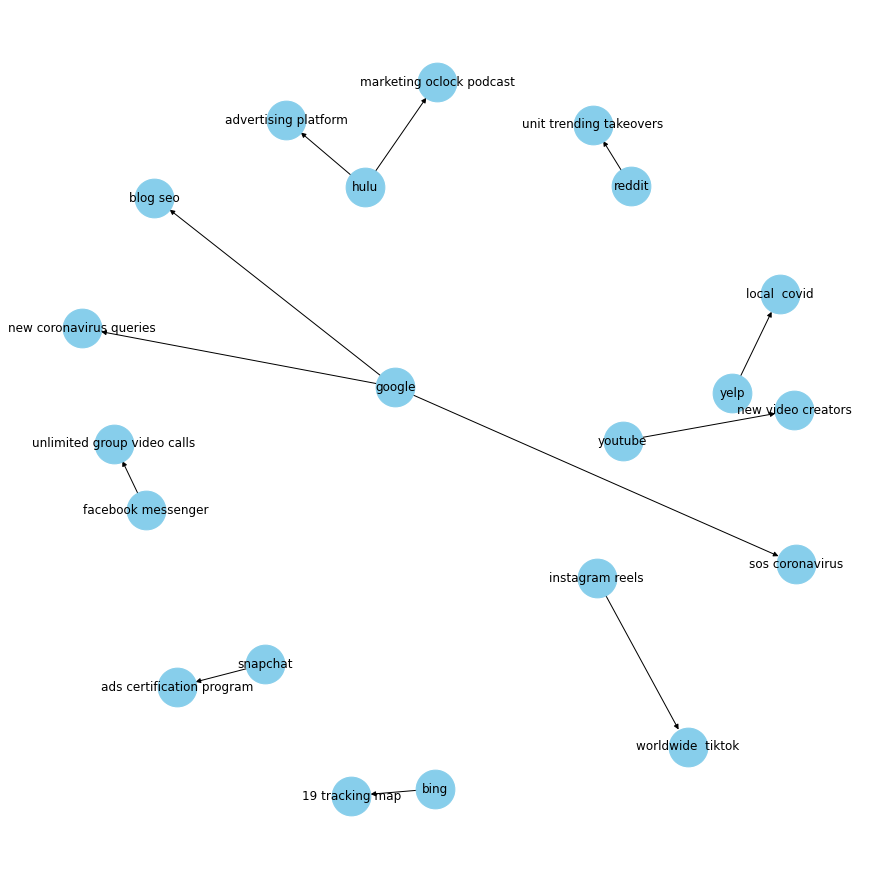

In [ ]:
display_graph("launches")

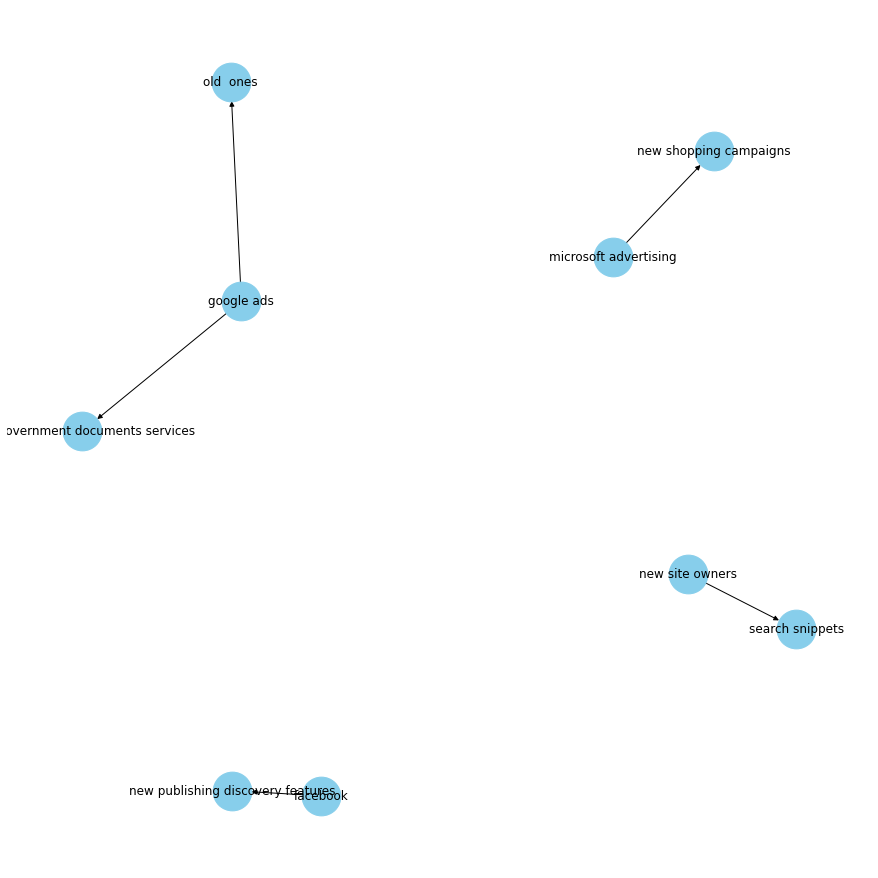

In [ ]:
display_graph("introduces new")

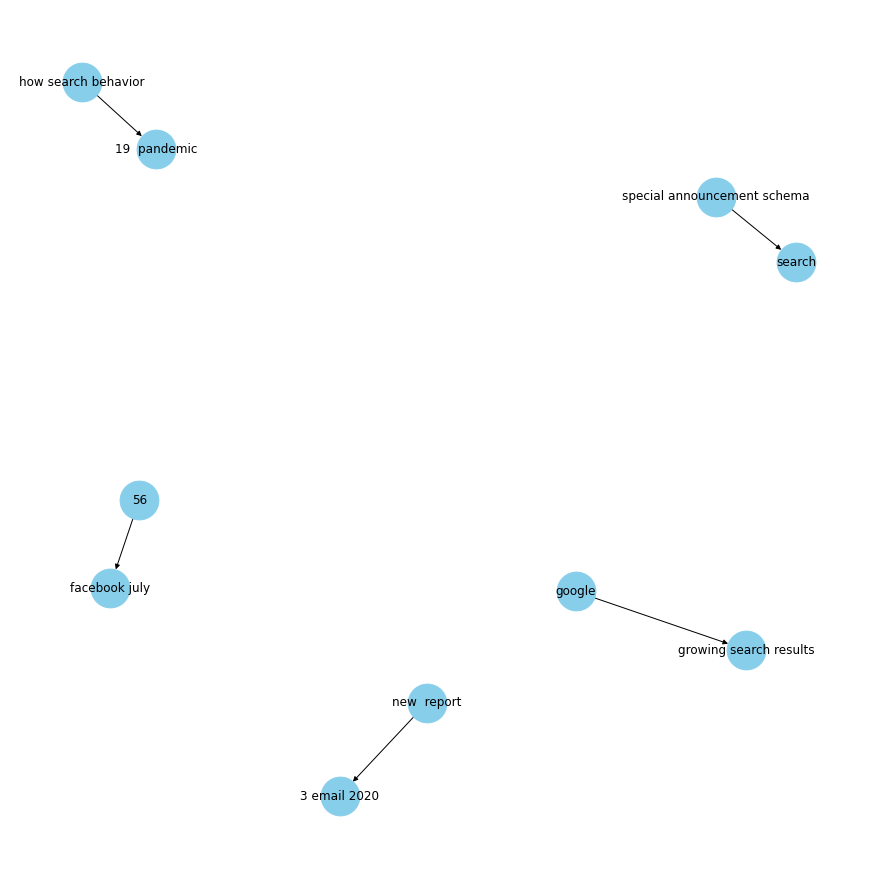

In [ ]:
display_graph("reveals")

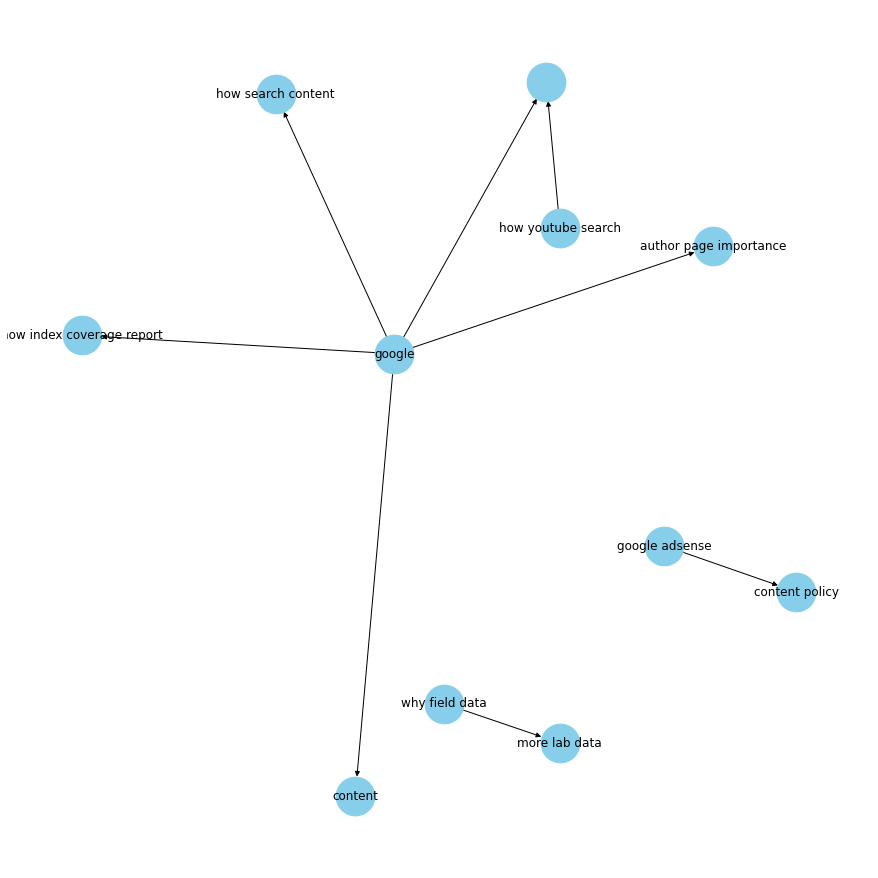

In [ ]:
display_graph("explains")

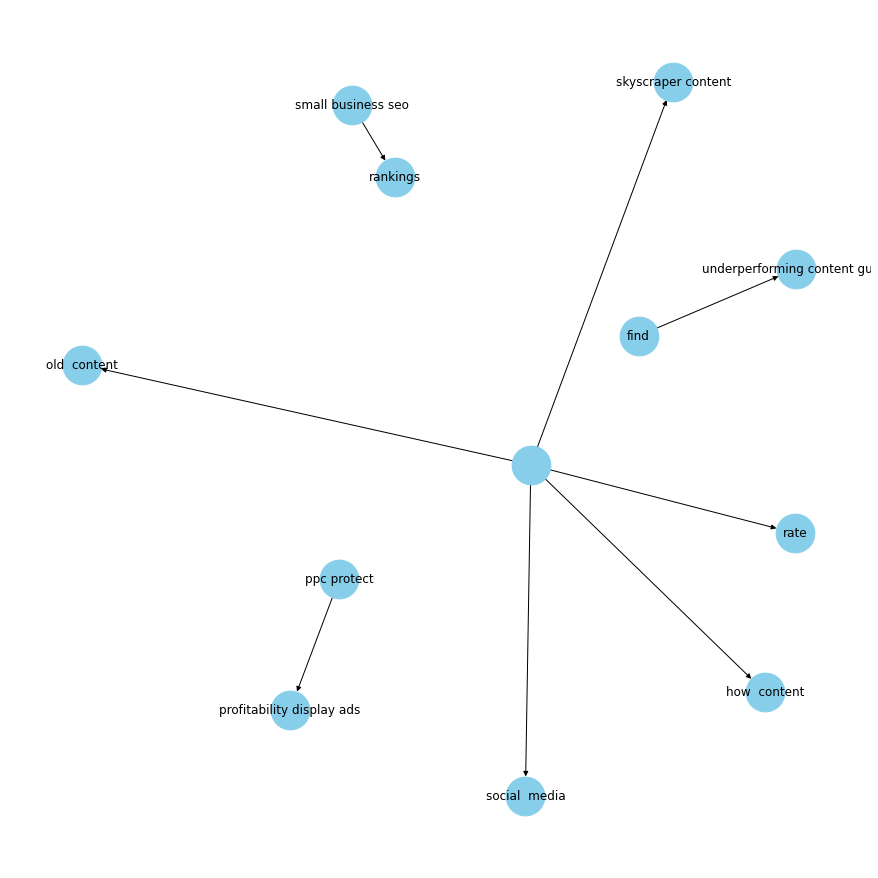

In [ ]:
display_graph("improve")

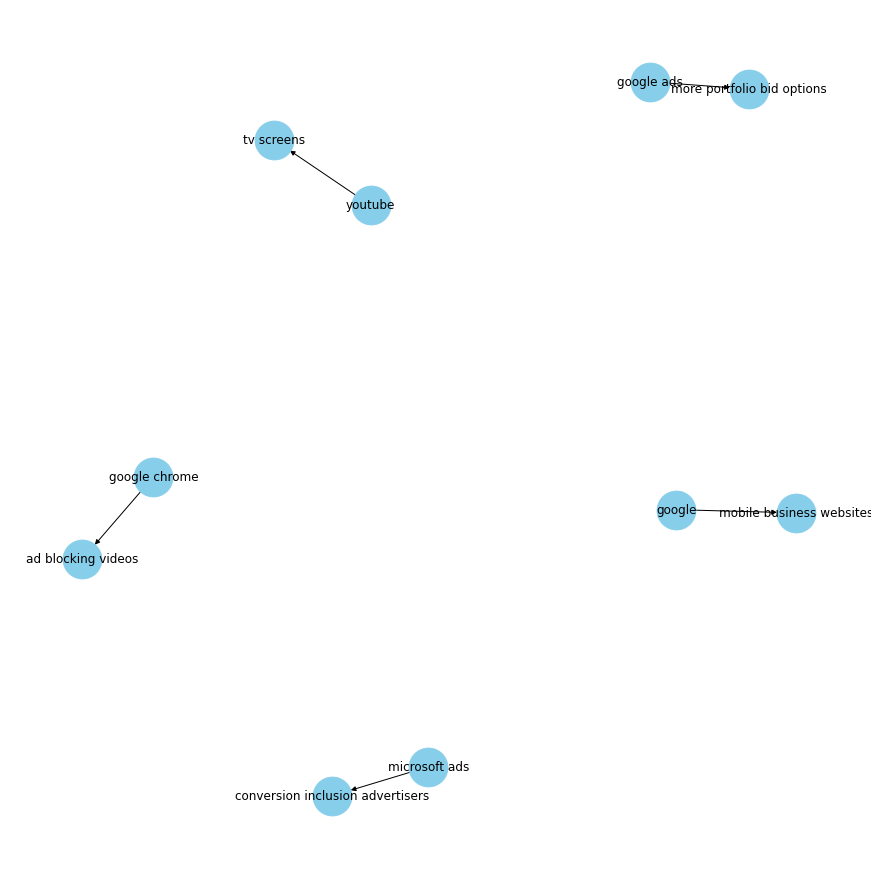

In [ ]:
display_graph("expands")

2

In [ ]:
pd.Series(relations).value_counts()[4:50].to_dict()


{'adds': 9,
 'ads': 6,
 'are': 5,
 'building': 4,
 'building for': 5,
 'content': 8,
 'covid': 7,
 'engines': 5,
 'examples': 8,
 'expands': 5,
 'explains': 8,
 'facebook': 11,
 'factors': 4,
 'facts': 4,
 'find': 5,
 'get': 7,
 'google': 9,
 'google on': 7,
 'improve': 8,
 'instagram': 5,
 'introduces': 7,
 'introduces new': 5,
 'is': 11,
 'know': 4,
 'launches': 12,
 'lets': 7,
 'link': 8,
 'links': 7,
 'make': 5,
 'makes': 9,
 'on': 9,
 'optimize': 8,
 'paid': 6,
 'plugins': 6,
 'podcast': 7,
 'ppc': 5,
 'reveals': 5,
 'says': 5,
 'search': 9,
 'strategy': 10,
 'tools': 7,
 'trends': 10,
 'update': 7,
 'use': 7,
 'vulnerability': 6,
 'ways': 7}

In [ ]:
relation_list = list(pd.Series(relations).value_counts()[4:50].to_dict().keys())
relation_list


['launches',
 'facebook',
 'is',
 'strategy',
 'trends',
 'google',
 'on',
 'makes',
 'search',
 'adds',
 'improve',
 'explains',
 'examples',
 'optimize',
 'content',
 'link',
 'lets',
 'covid',
 'get',
 'google on',
 'use',
 'ways',
 'links',
 'update',
 'introduces',
 'tools',
 'podcast',
 'ads',
 'plugins',
 'vulnerability',
 'paid',
 'instagram',
 'expands',
 'says',
 'find',
 'are',
 'reveals',
 'introduces new',
 'ppc',
 'building for',
 'make',
 'engines',
 'factors',
 'know',
 'facts',
 'building']

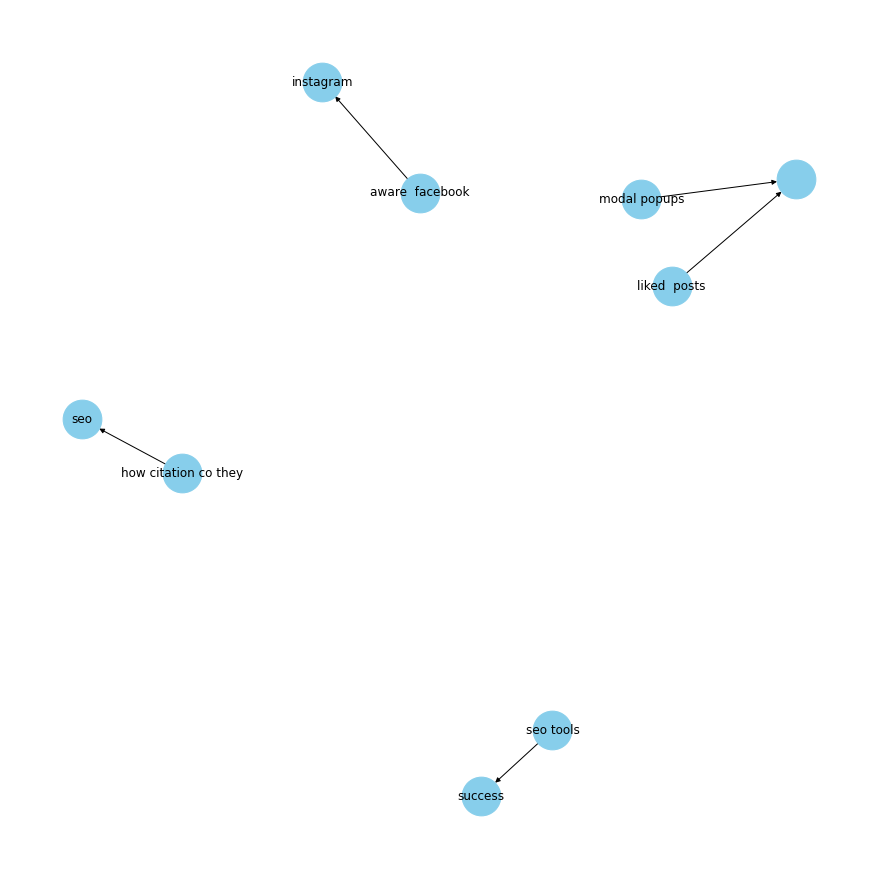

In [ ]:
relation_choice = "are"  #@param ['launches', 'is',  'on', 'makes', 'adds', 'improve', 'explains', 'optimize','get','use','update','introduces', 'expands','says','find','are','reveals','introduces new', 'make', 'know' ]

display_graph(relation_choice)